# GraphRAG: Graph-Enhanced Retrieval-Augmented Generation

## Overview

GraphRAG is an advanced question-answering system that combines the power of graph-based knowledge representation with retrieval-augmented generation. It processes input documents to create a rich knowledge graph, which is then used to enhance the retrieval and generation of answers to user queries. The system leverages natural language processing, machine learning, and graph theory to provide more accurate and contextually relevant responses.

## Motivation

Traditional retrieval-augmented generation systems often struggle with maintaining context over long documents and making connections between related pieces of information. GraphRAG addresses these limitations by:

1. Representing knowledge as an interconnected graph, allowing for better preservation of relationships between concepts.
2. Enabling more intelligent traversal of information during the query process.
3. Providing a visual representation of how information is connected and accessed during the answering process.

## Key Components

1. **DocumentProcessor**: Handles the initial processing of input documents, creating text chunks and embeddings.

2. **KnowledgeGraph**: Constructs a graph representation of the processed documents, where nodes represent text chunks and edges represent relationships between them.

3. **QueryEngine**: Manages the process of answering user queries by leveraging the knowledge graph and vector store.

4. **Visualizer**: Creates a visual representation of the graph and the traversal path taken to answer a query.

## Method Details

1. **Document Processing**:
   - Input documents are split into manageable chunks.
   - Each chunk is embedded using a language model.
   - A vector store is created from these embeddings for efficient similarity search.

2. **Knowledge Graph Construction**:
   - Graph nodes are created for each text chunk.
   - Concepts are extracted from each chunk using a combination of NLP techniques and language models.
   - Extracted concepts are lemmatized to improve matching.
   - Edges are added between nodes based on semantic similarity and shared concepts.
   - Edge weights are calculated to represent the strength of relationships.

3. **Query Processing**:
   - The user query is embedded and used to retrieve relevant documents from the vector store.
   - A priority queue is initialized with the nodes corresponding to the most relevant documents.
   - The system employs a Dijkstra-like algorithm to traverse the knowledge graph:
     * Nodes are explored in order of their priority (strength of connection to the query).
     * For each explored node:
       - Its content is added to the context.
       - The system checks if the current context provides a complete answer.
       - If the answer is incomplete:
         * The node's concepts are processed and added to a set of visited concepts.
         * Neighboring nodes are explored, with their priorities updated based on edge weights.
         * Nodes are added to the priority queue if a stronger connection is found.
   - This process continues until a complete answer is found or the priority queue is exhausted.
   - If no complete answer is found after traversing the graph, the system generates a final answer using the accumulated context and a large language model.

4. **Visualization**:
   - The knowledge graph is visualized with nodes representing text chunks and edges representing relationships.
   - Edge colors indicate the strength of relationships (weights).
   - The traversal path taken to answer a query is highlighted with curved, dashed arrows.
   - Start and end nodes of the traversal are distinctly colored for easy identification.

## Benefits of This Approach

1. **Improved Context Awareness**: By representing knowledge as a graph, the system can maintain better context and make connections across different parts of the input documents.

2. **Enhanced Retrieval**: The graph structure allows for more intelligent retrieval of information, going beyond simple keyword matching.

3. **Explainable Results**: The visualization of the graph and traversal path provides insight into how the system arrived at its answer, improving transparency and trust.

4. **Flexible Knowledge Representation**: The graph structure can easily incorporate new information and relationships as they become available.

5. **Efficient Information Traversal**: The weighted edges in the graph allow the system to prioritize the most relevant information pathways when answering queries.

## Conclusion

GraphRAG represents a significant advancement in retrieval-augmented generation systems. By incorporating a graph-based knowledge representation and intelligent traversal mechanisms, it offers improved context awareness, more accurate retrieval, and enhanced explainability. The system's ability to visualize its decision-making process provides valuable insights into its operation, making it a powerful tool for both end-users and developers. As natural language processing and graph-based AI continue to evolve, systems like GraphRAG pave the way for more sophisticated and capable question-answering technologies.

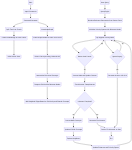

### Import relevant libraries

In [ ]:
import networkx as nx
from langchain.vectorstores import FAISS
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain.prompts import PromptTemplate
from langchain.retrievers import ContextualCompressionRetriever
from langchain.retrievers.document_compressors import LLMChainExtractor
from langchain.callbacks import get_openai_callback

from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import sys
from dotenv import load_dotenv
from langchain_openai import AzureChatOpenAI
from langchain_openai import AzureOpenAIEmbeddings
from typing import List, Tuple, Dict
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import nltk
import spacy
import heapq


from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm
import numpy as np

from spacy.cli import download
from spacy.lang.en import English


sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..'))) # Add the parent directory to the path sicnce we work with notebooks

# Load environment variables from a .env file
load_dotenv()

def _set_env(key: str, value: str):
    os.environ[key] = value

# Set the OpenAI API key environment variable
_set_env("AZURE_API_VERSION", "")
_set_env("AZURE_OPENAI_EMBEDDING_KEY", "")
_set_env("AZURE_OPENAI_EMBEDDING_ENDPOINT", "")
_set_env("AZURE_OPENAI_EMBEDDING_MODEL", "")
_set_env("AZURE_OPENAI_EMBEDDING_DEPLOYMENT_NAME", "")
_set_env("AZURE_OPENAI_CHAT_KEY", "")
_set_env("AZURE_OPENAI_CHAT_ENDPOINT", "")
_set_env("AZURE_OPENAI_CHAT_MODEL", "")
_set_env("AZURE_OPENAI_CHAT_DEPLOYMENT_NAME", "")
_set_env("TOKENIZERS_PARALLELISM", "false")
_set_env("LANGSMITH_TRACING", "true")
_set_env("LANGSMITH_ENDPOINT", "https://api.smith.langchain.com")
_set_env("LANGSMITH_PROJECT", "graph-rag-2")
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

nltk.download('punkt', quiet=True)
nltk.download('wordnet', quiet=True)

True

### Define the document processor class

In [2]:
# Define the DocumentProcessor class

class DocumentProcessor:
    def __init__(self):
        """
        Initializes the DocumentProcessor with a text splitter and OpenAI embeddings.
        
        Attributes:
        - text_splitter: An instance of RecursiveCharacterTextSplitter with specified chunk size and overlap.
        - embeddings: An instance of OpenAIEmbeddings used for embedding documents.
        """
        self.text_splitter = RecursiveCharacterTextSplitter(chunk_size=500, chunk_overlap=100)
        self.embeddings = AzureOpenAIEmbeddings(
            model=os.environ["AZURE_OPENAI_EMBEDDING_MODEL"],
            azure_endpoint=os.environ["AZURE_OPENAI_EMBEDDING_ENDPOINT"],
            azure_deployment=os.environ["AZURE_OPENAI_EMBEDDING_DEPLOYMENT_NAME"],
            openai_api_version=os.environ["AZURE_API_VERSION"],
            api_key=os.environ["AZURE_OPENAI_EMBEDDING_KEY"]
        )

    def process_documents(self, documents):
        """
        Processes a list of documents by splitting them into smaller chunks and creating a vector store.
        
        Args:
        - documents (list of str): A list of documents to be processed.
        
        Returns:
        - tuple: A tuple containing:
          - splits (list of str): The list of split document chunks.
          - vector_store (FAISS): A FAISS vector store created from the split document chunks and their embeddings.
        """
        splits = self.text_splitter.split_documents(documents)
        vector_store = FAISS.from_documents(splits, self.embeddings)
        return splits, vector_store

    def create_embeddings_batch(self, texts, batch_size=32):
        """
        Creates embeddings for a list of texts in batches.
        
        Args:
        - texts (list of str): A list of texts to be embedded.
        - batch_size (int, optional): The number of texts to process in each batch. Default is 32.
        
        Returns:
        - numpy.ndarray: An array of embeddings for the input texts.
        """
        embeddings = []
        for i in range(0, len(texts), batch_size):
            batch = texts[i:i+batch_size]
            batch_embeddings = self.embeddings.embed_documents(batch)
            embeddings.extend(batch_embeddings)
        return np.array(embeddings)

    def compute_similarity_matrix(self, embeddings):
        """
        Computes a cosine similarity matrix for a given set of embeddings.
        
        Args:
        - embeddings (numpy.ndarray): An array of embeddings.
        
        Returns:
        - numpy.ndarray: A cosine similarity matrix for the input embeddings.
        """
        return cosine_similarity(embeddings)


### Define the knowledge graph class

In [3]:
# Define the Concepts class
from pydantic import BaseModel, Field

class Concepts(BaseModel):
    concepts_list: List[str] = Field(description="List of concepts")

# Define the KnowledgeGraph class
class KnowledgeGraph:
    def __init__(self):
        """
        Initializes the KnowledgeGraph with a graph, lemmatizer, and NLP model.
        
        Attributes:
        - graph: An instance of a networkx Graph.
        - lemmatizer: An instance of WordNetLemmatizer.
        - concept_cache: A dictionary to cache extracted concepts.
        - nlp: An instance of a spaCy NLP model.
        - edges_threshold: A float value that sets the threshold for adding edges based on similarity.
        """
        self.graph = nx.Graph()
        self.lemmatizer = WordNetLemmatizer()
        self.concept_cache = {}
        self.nlp = self._load_spacy_model()
        self.edges_threshold = 0.8

    def build_graph(self, splits, llm, embedding_model):
        """
        Builds the knowledge graph by adding nodes, creating embeddings, extracting concepts, and adding edges.
        
        Args:
        - splits (list): A list of document splits.
        - llm: An instance of a large language model.
        - embedding_model: An instance of an embedding model.
        
        Returns:
        - None
        """
        self._add_nodes(splits)
        embeddings = self._create_embeddings(splits, embedding_model)
        self._extract_concepts(splits, llm)
        self._add_edges(embeddings)

    def _add_nodes(self, splits):
        """
        Adds nodes to the graph from the document splits.
        
        Args:
        - splits (list): A list of document splits.
        
        Returns:
        - None
        """
        for i, split in enumerate(splits):
            self.graph.add_node(i, content=split.page_content)

    def _create_embeddings(self, splits, embedding_model):
        """
        Creates embeddings for the document splits using the embedding model.
        
        Args:
        - splits (list): A list of document splits.
        - embedding_model: An instance of an embedding model.
        
        Returns:
        - numpy.ndarray: An array of embeddings for the document splits.
        """
        texts = [split.page_content for split in splits]
        return embedding_model.embed_documents(texts)

    def _compute_similarities(self, embeddings):
        """
        Computes the cosine similarity matrix for the embeddings.
        
        Args:
        - embeddings (numpy.ndarray): An array of embeddings.
        
        Returns:
        - numpy.ndarray: A cosine similarity matrix for the embeddings.
        """
        return cosine_similarity(embeddings)

    def _load_spacy_model(self):
        """
        Loads the spaCy NLP model, downloading it if necessary.
        
        Args:
        - None
        
        Returns:
        - spacy.Language: An instance of a spaCy NLP model.
        """
        try:
            return spacy.load("en_core_web_sm")
        except OSError:
            print("Downloading spaCy model...")
            download("en_core_web_sm")
            return spacy.load("en_core_web_sm")

    def _extract_concepts_and_entities(self, content, llm):
        """
        Extracts concepts and named entities from the content using spaCy and a large language model.
        
        Args:
        - content (str): The content from which to extract concepts and entities.
        - llm: An instance of a large language model.
        
        Returns:
        - list: A list of extracted concepts and entities.
        """
        if content in self.concept_cache:
            return self.concept_cache[content]
        
        # Extract named entities using spaCy
        doc = self.nlp(content)
        named_entities = [ent.text for ent in doc.ents if ent.label_ in ["PERSON", "ORG", "GPE", "WORK_OF_ART"]]
        
        # Extract general concepts using LLM
        concept_extraction_prompt = PromptTemplate(
            input_variables=["text"],
            template="Extract key concepts (excluding named entities) from the following text:\n\n{text}\n\nKey concepts:"
        )
        concept_chain = concept_extraction_prompt | llm.with_structured_output(Concepts)
        general_concepts = concept_chain.invoke({"text": content}).concepts_list
        
        # Combine named entities and general concepts
        all_concepts = list(set(named_entities + general_concepts))
        
        self.concept_cache[content] = all_concepts
        return all_concepts

    def _extract_concepts(self, splits, llm):
        """
        Extracts concepts for all document splits using multi-threading.
        
        Args:
        - splits (list): A list of document splits.
        - llm: An instance of a large language model.
        
        Returns:
        - None
        """
        with ThreadPoolExecutor() as executor:
            future_to_node = {executor.submit(self._extract_concepts_and_entities, split.page_content, llm): i 
                              for i, split in enumerate(splits)}
            
            for future in tqdm(as_completed(future_to_node), total=len(splits), desc="Extracting concepts and entities"):
                node = future_to_node[future]
                concepts = future.result()
                self.graph.nodes[node]['concepts'] = concepts

    def _add_edges(self, embeddings):
        """
        Adds edges to the graph based on the similarity of embeddings and shared concepts.
        
        Args:
        - embeddings (numpy.ndarray): An array of embeddings for the document splits.
        
        Returns:
        - None
        """
        similarity_matrix = self._compute_similarities(embeddings)
        num_nodes = len(self.graph.nodes)
        
        for node1 in tqdm(range(num_nodes), desc="Adding edges"):
            for node2 in range(node1 + 1, num_nodes):
                similarity_score = similarity_matrix[node1][node2]
                if similarity_score > self.edges_threshold:
                    shared_concepts = set(self.graph.nodes[node1]['concepts']) & set(self.graph.nodes[node2]['concepts'])
                    edge_weight = self._calculate_edge_weight(node1, node2, similarity_score, shared_concepts)
                    self.graph.add_edge(node1, node2, weight=edge_weight, 
                                        similarity=similarity_score,
                                        shared_concepts=list(shared_concepts))

    def _calculate_edge_weight(self, node1, node2, similarity_score, shared_concepts, alpha=0.7, beta=0.3):
        """
        Calculates the weight of an edge based on similarity score and shared concepts.
        
        Args:
        - node1 (int): The first node.
        - node2 (int): The second node.
        - similarity_score (float): The similarity score between the nodes.
        - shared_concepts (set): The set of shared concepts between the nodes.
        - alpha (float, optional): The weight of the similarity score. Default is 0.7.
        - beta (float, optional): The weight of the shared concepts. Default is 0.3.
        
        Returns:
        - float: The calculated weight of the edge.
        """
        max_possible_shared = min(len(self.graph.nodes[node1]['concepts']), len(self.graph.nodes[node2]['concepts']))
        normalized_shared_concepts = len(shared_concepts) / max_possible_shared if max_possible_shared > 0 else 0
        return alpha * similarity_score + beta * normalized_shared_concepts

    def _lemmatize_concept(self, concept):
        """
        Lemmatizes a given concept.
        
        Args:
        - concept (str): The concept to be lemmatized.
        
        Returns:
        - str: The lemmatized concept.
        """
        return ' '.join([self.lemmatizer.lemmatize(word) for word in concept.lower().split()])


### Define the Query Engine class

In [4]:

# Define the AnswerCheck class
class AnswerCheck(BaseModel):
    is_complete: bool = Field(description="Whether the current context provides a complete answer to the query")
    answer: str = Field(description="The current answer based on the context, if any")

# Define the QueryEngine class
class QueryEngine:
    def __init__(self, vector_store, knowledge_graph, llm):
        self.vector_store = vector_store
        self.knowledge_graph = knowledge_graph
        self.llm = llm
        self.max_context_length = 4000
        self.answer_check_chain = self._create_answer_check_chain()

    def _create_answer_check_chain(self):
        """
        Creates a chain to check if the context provides a complete answer to the query.
        
        Args:
        - None
        
        Returns:
        - Chain: A chain to check if the context provides a complete answer.
        """
        answer_check_prompt = PromptTemplate(
            input_variables=["query", "context"],
            template="Given the query: '{query}'\n\nAnd the current context:\n{context}\n\nDoes this context provide a complete answer to the query? If yes, provide the answer. If no, state that the answer is incomplete.\n\nIs complete answer (Yes/No):\nAnswer (if complete):"
        )
        return answer_check_prompt | self.llm.with_structured_output(AnswerCheck)

    def _check_answer(self, query: str, context: str) -> Tuple[bool, str]:
        """
        Checks if the current context provides a complete answer to the query.
        
        Args:
        - query (str): The query to be answered.
        - context (str): The current context.
        
        Returns:
        - tuple: A tuple containing:
          - is_complete (bool): Whether the context provides a complete answer.
          - answer (str): The answer based on the context, if complete.
        """
        response = self.answer_check_chain.invoke({"query": query, "context": context})
        return response.is_complete, response.answer

  

    def _expand_context(self, query: str, relevant_docs) -> Tuple[str, List[int], Dict[int, str], str]:
        """
        Expands the context by traversing the knowledge graph using a Dijkstra-like approach.
        
        This method implements a modified version of Dijkstra's algorithm to explore the knowledge graph,
        prioritizing the most relevant and strongly connected information. The algorithm works as follows:

        1. Initialize:
           - Start with nodes corresponding to the most relevant documents.
           - Use a priority queue to manage the traversal order, where priority is based on connection strength.
           - Maintain a dictionary of best known "distances" (inverse of connection strengths) to each node.

        2. Traverse:
           - Always explore the node with the highest priority (strongest connection) next.
           - For each node, check if we've found a complete answer.
           - Explore the node's neighbors, updating their priorities if a stronger connection is found.

        3. Concept Handling:
           - Track visited concepts to guide the exploration towards new, relevant information.
           - Expand to neighbors only if they introduce new concepts.

        4. Termination:
           - Stop if a complete answer is found.
           - Continue until the priority queue is empty (all reachable nodes explored).

        This approach ensures that:
        - We prioritize the most relevant and strongly connected information.
        - We explore new concepts systematically.
        - We find the most relevant answer by following the strongest connections in the knowledge graph.

        Args:
        - query (str): The query to be answered.
        - relevant_docs (List[Document]): A list of relevant documents to start the traversal.

        Returns:
        - tuple: A tuple containing:
          - expanded_context (str): The accumulated context from traversed nodes.
          - traversal_path (List[int]): The sequence of node indices visited.
          - filtered_content (Dict[int, str]): A mapping of node indices to their content.
          - final_answer (str): The final answer found, if any.
        """
        # Initialize variables
        # expanded_context = ""
        # traversal_path = []
        # visited_concepts = set()
        # filtered_content = {}
        # final_answer = ""
        
        # priority_queue = []
        # distances = {}  # Stores the best known "distance" (inverse of connection strength) to each node
        
        # print("\nTraversing the knowledge graph:")
        
        # # Initialize priority queue with closest nodes from relevant docs
        # for doc in relevant_docs:
        #     # Find the most similar node in the knowledge graph for each relevant document
        #     closest_nodes = self.vector_store.similarity_search_with_score(doc.page_content, k=1)
        #     closest_node_content, similarity_score = closest_nodes[0]
            
        #     # Get the corresponding node in our knowledge graph
        #     closest_node = next(n for n in self.knowledge_graph.graph.nodes if self.knowledge_graph.graph.nodes[n]['content'] == closest_node_content.page_content)
            
        #     # Initialize priority (inverse of similarity score for min-heap behavior)
        #     priority = 1 / similarity_score
        #     heapq.heappush(priority_queue, (priority, closest_node))
        #     distances[closest_node] = priority
        
        # step = 0
        # while priority_queue:
        #     # Get the node with the highest priority (lowest distance value)
        #     current_priority, current_node = heapq.heappop(priority_queue)
            
        #     # Skip if we've already found a better path to this node
        #     if current_priority > distances.get(current_node, float('inf')):
        #         continue
            
        #     if current_node not in traversal_path:
        #         step += 1
        #         traversal_path.append(current_node)
        #         node_content = self.knowledge_graph.graph.nodes[current_node]['content']
        #         node_concepts = self.knowledge_graph.graph.nodes[current_node]['concepts']
                
        #         # Add node content to our accumulated context
        #         filtered_content[current_node] = node_content
        #         expanded_context += "\n" + node_content if expanded_context else node_content
                
        #         # Log the current step for debugging and visualization
        #         print(f"\nStep {step} - Node {current_node}:")
        #         print(f"Content: {node_content[:100]}...") 
        #         print(f"Concepts: {', '.join(node_concepts)}")
        #         print("-" * 50)
                
        #         # Check if we have a complete answer with the current context
        #         is_complete, answer = self._check_answer(query, expanded_context)
        #         if is_complete:
        #             final_answer = answer
        #             break
                
        #         # Process the concepts of the current node
        #         node_concepts_set = set(self.knowledge_graph._lemmatize_concept(c) for c in node_concepts)
        #         if not node_concepts_set.issubset(visited_concepts):
        #             visited_concepts.update(node_concepts_set)
                    
        #             # Explore neighbors
        #             for neighbor in self.knowledge_graph.graph.neighbors(current_node):
        #                 edge_data = self.knowledge_graph.graph[current_node][neighbor]
        #                 edge_weight = edge_data['weight']
                        
        #                 # Calculate new distance (priority) to the neighbor
        #                 # Note: We use 1 / edge_weight because higher weights mean stronger connections
        #                 distance = current_priority + (1 / edge_weight)
                        
        #                 # If we've found a stronger connection to the neighbor, update its distance
        #                 if distance < distances.get(neighbor, float('inf')):
        #                     distances[neighbor] = distance
        #                     heapq.heappush(priority_queue, (distance, neighbor))
                            
        #                     # Process the neighbor node if it's not already in our traversal path
        #                     if neighbor not in traversal_path:
        #                         step += 1
        #                         traversal_path.append(neighbor)
        #                         neighbor_content = self.knowledge_graph.graph.nodes[neighbor]['content']
        #                         neighbor_concepts = self.knowledge_graph.graph.nodes[neighbor]['concepts']
                                
        #                         filtered_content[neighbor] = neighbor_content
        #                         expanded_context += "\n" + neighbor_content if expanded_context else neighbor_content
                                
        #                         # Log the neighbor node information
        #                         print(f"\nStep {step} - Node {neighbor} (neighbor of {current_node}):")
        #                         print(f"Content: {neighbor_content[:100]}...")
        #                         print(f"Concepts: {', '.join(neighbor_concepts)}")
        #                         print("-" * 50)
                                
        #                         # Check if we have a complete answer after adding the neighbor's content
        #                         is_complete, answer = self._check_answer(query, expanded_context)
        #                         if is_complete:
        #                             final_answer = answer
        #                             break
                                
        #                         # Process the neighbor's concepts
        #                         neighbor_concepts_set = set(self.knowledge_graph._lemmatize_concept(c) for c in neighbor_concepts)
        #                         if not neighbor_concepts_set.issubset(visited_concepts):
        #                             visited_concepts.update(neighbor_concepts_set)
                
        #         # If we found a final answer, break out of the main loop
        #         if final_answer:
        #             break

        # # If we haven't found a complete answer, generate one using the LLM
        # if not final_answer:
        #     print("\nGenerating final answer...")
        #     response_prompt = PromptTemplate(
        #         input_variables=["query", "context"],
        #         template="Based on the following context, please answer the query.\n\nContext: {context}\n\nQuery: {query}\n\nAnswer:"
        #     )
        #     response_chain = response_prompt | self.llm
        #     input_data = {"query": query, "context": expanded_context}
        #     final_answer = response_chain.invoke(input_data)

        # return expanded_context, traversal_path, filtered_content, final_answer

        expanded_context = ""
        traversal_path = []
        visited_concepts = set()
        filtered_content = {}
        final_answer = ""
        
        priority_queue = []
        distances = {}  # Stores the best known "distance" (inverse of connection strength) to each node
        
        print("\nTraversing the knowledge graph:")
        
        # Initialize priority queue with closest nodes from relevant docs
        for doc in relevant_docs:
            # Find the most similar node in the knowledge graph for each relevant document
            closest_nodes = self.vector_store.similarity_search_with_score(doc.page_content, k=1)
            closest_node_content, similarity_score = closest_nodes[0]
            
            # Get the corresponding node in our knowledge graph
            closest_node = next(n for n in self.knowledge_graph.graph.nodes if self.knowledge_graph.graph.nodes[n]['content'] == closest_node_content.page_content)
            
            # Initialize priority (inverse of similarity score for min-heap behavior)
            priority = 1 / similarity_score
            heapq.heappush(priority_queue, (priority, closest_node))
            distances[closest_node] = priority
        
        step = 0
        max_steps = 20
        while priority_queue and step < max_steps:
            # Get the node with the highest priority (lowest distance value)
            current_priority, current_node = heapq.heappop(priority_queue)
            
            # Skip if we've already found a better path to this node
            if current_priority > distances.get(current_node, float('inf')):
                continue
            
            if current_node not in traversal_path:
                step += 1
                traversal_path.append(current_node)
                node_content = self.knowledge_graph.graph.nodes[current_node]['content']
                node_concepts = self.knowledge_graph.graph.nodes[current_node]['concepts']
                
                # Add node content to our accumulated context
                filtered_content[current_node] = node_content
                expanded_context += "\n" + node_content if expanded_context else node_content
                
                # Log the current step for debugging and visualization
                print(f"\nStep {step} - Node {current_node}:")
                print(f"Content: {node_content[:100]}...") 
                print(f"Concepts: {', '.join(node_concepts)}")
                print("-" * 50)
                
                # Check if we have a complete answer with the current context
                is_complete, answer = self._check_answer(query, expanded_context)
                if is_complete:
                    final_answer = answer
                    break
                
                # Process the concepts of the current node
                node_concepts_set = set(self.knowledge_graph._lemmatize_concept(c) for c in node_concepts)
                if not node_concepts_set.issubset(visited_concepts):
                    visited_concepts.update(node_concepts_set)
                    
                    # Explore neighbors
                    neighbors = list(self.knowledge_graph.graph.neighbors(current_node))
                    
                    # Calculate the connection strength for each neighbor
                    neighbor_connections = []
                    for neighbor in neighbors:
                        edge_data = self.knowledge_graph.graph[current_node][neighbor]
                        edge_weight = edge_data['weight']
                        neighbor_connections.append((1 / edge_weight, neighbor))  # Use inverse weight as priority
                    
                    # Sort neighbors by connection strength (highest strength first)
                    neighbor_connections.sort(key=lambda x: x[0])
                    
                    # Select the top 5 neighbors or fewer if there are less than 5
                    top_neighbors = neighbor_connections[:5]
                    
                    # Process the top neighbors
                    for priority, neighbor in top_neighbors:
                        # Calculate new distance (priority) to the neighbor
                        distance = current_priority + priority
                        
                        # If we've found a stronger connection to the neighbor, update its distance
                        if distance < distances.get(neighbor, float('inf')):
                            distances[neighbor] = distance
                            heapq.heappush(priority_queue, (distance, neighbor))
                            
                            # Process the neighbor node if it's not already in our traversal path
                            if neighbor not in traversal_path:
                                step += 1
                                traversal_path.append(neighbor)
                                neighbor_content = self.knowledge_graph.graph.nodes[neighbor]['content']
                                neighbor_concepts = self.knowledge_graph.graph.nodes[neighbor]['concepts']
                                
                                filtered_content[neighbor] = neighbor_content
                                expanded_context += "\n" + neighbor_content if expanded_context else neighbor_content
                                
                                # Log the neighbor node information
                                print(f"\nStep {step} - Node {neighbor} (neighbor of {current_node}):")
                                print(f"Content: {neighbor_content[:100]}...")
                                print(f"Concepts: {', '.join(neighbor_concepts)}")
                                print("-" * 50)
                                
                                # Check if we have a complete answer after adding the neighbor's content
                                is_complete, answer = self._check_answer(query, expanded_context)
                                if is_complete:
                                    final_answer = answer
                                    break
                                
                                # Process the neighbor's concepts
                                neighbor_concepts_set = set(self.knowledge_graph._lemmatize_concept(c) for c in neighbor_concepts)
                                if not neighbor_concepts_set.issubset(visited_concepts):
                                    visited_concepts.update(neighbor_concepts_set)
                
                # If we found a final answer, break out of the main loop
                if final_answer:
                    break

        # If we haven't found a complete answer, generate one using the LLM
        if not final_answer:
            print("\nGenerating final answer...")
            response_prompt = PromptTemplate(
                input_variables=["query", "context"],
                template="Based on the following context, please answer the query.\n\nContext: {context}\n\nQuery: {query}\n\nAnswer:"
            )
            response_chain = response_prompt | self.llm
            input_data = {"query": query, "context": expanded_context}
            final_answer = response_chain.invoke(input_data).content

        return expanded_context, traversal_path, filtered_content, final_answer

    def query(self, query: str) -> Tuple[str, List[int], Dict[int, str]]:
        """
        Processes a query by retrieving relevant documents, expanding the context, and generating the final answer.
        
        Args:
        - query (str): The query to be answered.
        
        Returns:
        - tuple: A tuple containing:
          - final_answer (str): The final answer to the query.
          - traversal_path (list): The traversal path of nodes in the knowledge graph.
          - filtered_content (dict): The filtered content of nodes.
        """
        with get_openai_callback() as cb:
            print(f"\nProcessing query: {query}")
            relevant_docs = self._retrieve_relevant_documents(query)
            expanded_context, traversal_path, filtered_content, final_answer = self._expand_context(query, relevant_docs)
            
            if not final_answer:
                print("\nGenerating final answer...")
                response_prompt = PromptTemplate(
                    input_variables=["query", "context"],
                    template="Based on the following context, please answer the query.\n\nContext: {context}\n\nQuery: {query}\n\nAnswer:"
                )
                
                response_chain = response_prompt | self.llm
                input_data = {"query": query, "context": expanded_context}
                response = response_chain.invoke(input_data)
                final_answer = response
            else:
                print("\nComplete answer found during traversal.")
            
            print(f"\nFinal Answer: {final_answer}")
            print(f"\nTotal Tokens: {cb.total_tokens}")
            print(f"Prompt Tokens: {cb.prompt_tokens}")
            print(f"Completion Tokens: {cb.completion_tokens}")
            print(f"Total Cost (USD): ${cb.total_cost}")
        
        return final_answer, traversal_path, filtered_content

    def _retrieve_relevant_documents(self, query: str):
        """
        Retrieves relevant documents based on the query using the vector store.
        
        Args:
        - query (str): The query to be answered.
        
        Returns:
        - list: A list of relevant documents.
        """
        print("\nRetrieving relevant documents...")
        retriever = self.vector_store.as_retriever(search_type="similarity", search_kwargs={"k": 5})
        compressor = LLMChainExtractor.from_llm(self.llm)
        compression_retriever = ContextualCompressionRetriever(base_compressor=compressor, base_retriever=retriever)
        return compression_retriever.invoke(query)


### Define the Visualizer class

In [5]:
# Import necessary libraries
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Define the Visualizer class
class Visualizer:
    @staticmethod
    def visualize_traversal(graph, traversal_path):
        """
        Visualizes the traversal path on the knowledge graph with nodes, edges, and traversal path highlighted.

        Args:
        - graph (networkx.Graph): The knowledge graph containing nodes and edges.
        - traversal_path (list of int): The list of node indices representing the traversal path.

        Returns:
        - None
        """
        traversal_graph = nx.DiGraph()
        
        # Add nodes and edges from the original graph
        for node in graph.nodes():
            traversal_graph.add_node(node)
        for u, v, data in graph.edges(data=True):
            traversal_graph.add_edge(u, v, **data)
        
        fig, ax = plt.subplots(figsize=(16, 12))
        
        # Generate positions for all nodes
        pos = nx.spring_layout(traversal_graph, k=1, iterations=50)
        
        # Draw regular edges with color based on weight
        edges = traversal_graph.edges()
        edge_weights = [traversal_graph[u][v].get('weight', 0.5) for u, v in edges]
        nx.draw_networkx_edges(traversal_graph, pos, 
                               edgelist=edges,
                               edge_color=edge_weights,
                               edge_cmap=plt.cm.Blues,
                               width=2,
                               ax=ax)
        
        # Draw nodes
        nx.draw_networkx_nodes(traversal_graph, pos, 
                               node_color='lightblue',
                               node_size=3000,
                               ax=ax)
        
        # Draw traversal path with curved arrows
        edge_offset = 0.1
        for i in range(len(traversal_path) - 1):
            start = traversal_path[i]
            end = traversal_path[i + 1]
            start_pos = pos[start]
            end_pos = pos[end]
            
            # Calculate control point for curve
            mid_point = ((start_pos[0] + end_pos[0]) / 2, (start_pos[1] + end_pos[1]) / 2)
            control_point = (mid_point[0] + edge_offset, mid_point[1] + edge_offset)
            
            # Draw curved arrow
            arrow = patches.FancyArrowPatch(start_pos, end_pos,
                                            connectionstyle=f"arc3,rad={0.3}",
                                            color='red',
                                            arrowstyle="->",
                                            mutation_scale=20,
                                            linestyle='--',
                                            linewidth=2,
                                            zorder=4)
            ax.add_patch(arrow)
        
        # Prepare labels for the nodes
        labels = {}
        for i, node in enumerate(traversal_path):
            concepts = graph.nodes[node].get('concepts', [])
            label = f"{i + 1}. {concepts[0] if concepts else ''}"
            labels[node] = label
        
        for node in traversal_graph.nodes():
            if node not in labels:
                concepts = graph.nodes[node].get('concepts', [])
                labels[node] = concepts[0] if concepts else ''
        
        # Draw labels
        nx.draw_networkx_labels(traversal_graph, pos, labels, font_size=8, font_weight="bold", ax=ax)
        
        # Highlight start and end nodes
        start_node = traversal_path[0]
        end_node = traversal_path[-1]
        
        nx.draw_networkx_nodes(traversal_graph, pos, 
                               nodelist=[start_node], 
                               node_color='lightgreen', 
                               node_size=3000,
                               ax=ax)
        
        nx.draw_networkx_nodes(traversal_graph, pos, 
                               nodelist=[end_node], 
                               node_color='lightcoral', 
                               node_size=3000,
                               ax=ax)
        
        ax.set_title("Graph Traversal Flow")
        ax.axis('off')
        
        # Add colorbar for edge weights
        sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin=min(edge_weights), vmax=max(edge_weights)))
        sm.set_array([])
        cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
        cbar.set_label('Edge Weight', rotation=270, labelpad=15)
        
        # Add legend
        regular_line = plt.Line2D([0], [0], color='blue', linewidth=2, label='Regular Edge')
        traversal_line = plt.Line2D([0], [0], color='red', linewidth=2, linestyle='--', label='Traversal Path')
        start_point = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightgreen', markersize=15, label='Start Node')
        end_point = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightcoral', markersize=15, label='End Node')
        legend = plt.legend(handles=[regular_line, traversal_line, start_point, end_point], loc='upper left', bbox_to_anchor=(0, 1), ncol=2)
        legend.get_frame().set_alpha(0.8)

        plt.tight_layout()
        plt.show()

    @staticmethod
    def print_filtered_content(traversal_path, filtered_content):
        """
        Prints the filtered content of visited nodes in the order of traversal.

        Args:
        - traversal_path (list of int): The list of node indices representing the traversal path.
        - filtered_content (dict of int: str): A dictionary mapping node indices to their filtered content.

        Returns:
        - None
        """
        print("\nFiltered content of visited nodes in order of traversal:")
        for i, node in enumerate(traversal_path):
            print(f"\nStep {i + 1} - Node {node}:")
            print(f"Filtered Content: {filtered_content.get(node, 'No filtered content available')[:200]}...")  # Print first 200 characters
            print("-" * 50)


### Define the graph RAG class

In [6]:
from langchain_openai import AzureChatOpenAI

class GraphRAG:
    def __init__(self):
        """
        Initializes the GraphRAG system with components for document processing, knowledge graph construction,
        querying, and visualization.
        
        Attributes:
        - llm: An instance of a large language model (LLM) for generating responses.
        - embedding_model: An instance of an embedding model for document embeddings.
        - document_processor: An instance of the DocumentProcessor class for processing documents.
        - knowledge_graph: An instance of the KnowledgeGraph class for building and managing the knowledge graph.
        - query_engine: An instance of the QueryEngine class for handling queries (initialized as None).
        - visualizer: An instance of the Visualizer class for visualizing the knowledge graph traversal.
        """
        self.llm = AzureChatOpenAI(
            api_key = os.environ["AZURE_OPENAI_CHAT_KEY"],
            model=os.environ["AZURE_OPENAI_CHAT_MODEL"],
            azure_endpoint=os.environ["AZURE_OPENAI_CHAT_ENDPOINT"],
            azure_deployment=os.environ["AZURE_OPENAI_CHAT_DEPLOYMENT_NAME"],
            api_version=os.environ["AZURE_API_VERSION"],
            temperature=0,
            max_tokens=None,
            timeout=None,
            max_retries=2,
        )
        self.embedding_model = AzureOpenAIEmbeddings(
            model=os.environ["AZURE_OPENAI_EMBEDDING_MODEL"],
            azure_endpoint=os.environ["AZURE_OPENAI_EMBEDDING_ENDPOINT"],
            azure_deployment=os.environ["AZURE_OPENAI_EMBEDDING_DEPLOYMENT_NAME"],
            openai_api_version=os.environ["AZURE_API_VERSION"],
            api_key=os.environ["AZURE_OPENAI_EMBEDDING_KEY"]
        )
        self.document_processor = DocumentProcessor()
        self.knowledge_graph = KnowledgeGraph()
        self.query_engine = None
        self.visualizer = Visualizer()

    def process_documents(self, documents):
        """
        Processes a list of documents by splitting them into chunks, embedding them, and building a knowledge graph.
        
        Args:
        - documents (list of str): A list of documents to be processed.
        
        Returns:
        - None
        """
        splits, vector_store = self.document_processor.process_documents(documents)
        self.knowledge_graph.build_graph(splits, self.llm, self.embedding_model)
        self.query_engine = QueryEngine(vector_store, self.knowledge_graph, self.llm)

    def query(self, query: str):
        """
        Handles a query by retrieving relevant information from the knowledge graph and visualizing the traversal path.
        
        Args:
        - query (str): The query to be answered.
        
        Returns:
        - str: The response to the query.
        """
        response, traversal_path, filtered_content = self.query_engine.query(query)
        
        if traversal_path:
            self.visualizer.visualize_traversal(self.knowledge_graph.graph, traversal_path)
        else:
            print("No traversal path to visualize.")
        
        return response, filtered_content


### Define documents path

In [7]:
from langchain_community.document_loaders import TextLoader
txt_path = "healthInsurance.txt"

### Load the documents

In [8]:
loader = TextLoader(txt_path, encoding="utf-8")
documents = loader.load()
documents = documents

### Create a graph RAG instance

In [10]:
graph_rag = GraphRAG()

### Process the documents and create the graph

In [11]:
! pip install faiss-cpu

In [13]:
graph_rag.process_documents(documents)

Adding edges: 100%|██████████| 460/460 [00:00<00:00, 1346.06it/s]


### Input a query and get the retrieved information from the graph RAG

In [ ]:
query = "How does cashless hospitalization work under government health insurance schemes?"
response, context = graph_rag.query(query)

In [ ]:
print(response.content)

In [ ]:
print(context)


Processing query: What are the key differences between government and private health insurance schemes in India?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 159:
Content: # Health Insurance in India: Government Schemes Overview

## Introduction
Health insurance is crucia...
Concepts: middle income, medical emergencies, health insurance schemes, citizens, India, affordable healthcare, lower income, health insurance, Government of India, The Government of India, healthcare costs
--------------------------------------------------

Step 2 - Node 345 (neighbor of 159):
Content: # Health Insurance in India: A Comprehensive Guide

## Introduction
Health insurance is a vital comp...
Concepts: policy selection, A Comprehensive Guide, informed decisions, medical emergencies, insurance policy, options, insurance market, risk management, India, security, health insurance companies, financial planning, personal finance, benefits, coverage, health insurance, he

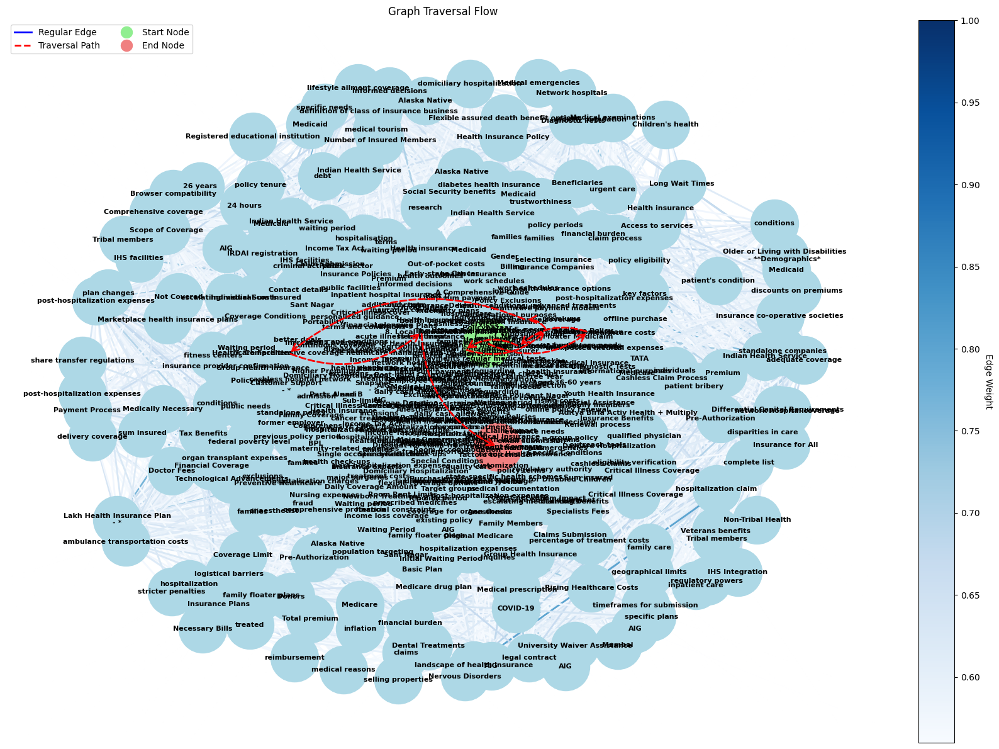


Processing query: How does cashless hospitalization work under government health insurance schemes?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 161:
Content: ## Key Features of Government Health Insurance Schemes
1. **Cashless Coverage**: Many schemes offer ...
Concepts: Discounts, Commitments, Air Ambulance Coverage, Long-term Policies, Consultations, Cashless Coverage, Emergency Medical Services, Medical Expenses, Diagnostics, Pharmacy
--------------------------------------------------

Step 2 - Node 282 (neighbor of 161):
Content: ## Key Features of Health Insurance Plans
- **Cashless Treatment**: Coverage for medical expenses wi...
Concepts: Air Ambulance Services, Discounts, Multi-Year Policies, Network Hospitals, Air Ambulance Cover, Percentage Discounts, Cashless Treatment, INR, Medical Expenses Coverage
--------------------------------------------------

Step 3 - Node 436 (neighbor of 161):
Content: ## Benefits of Purchasing a 5 Lakh Healt

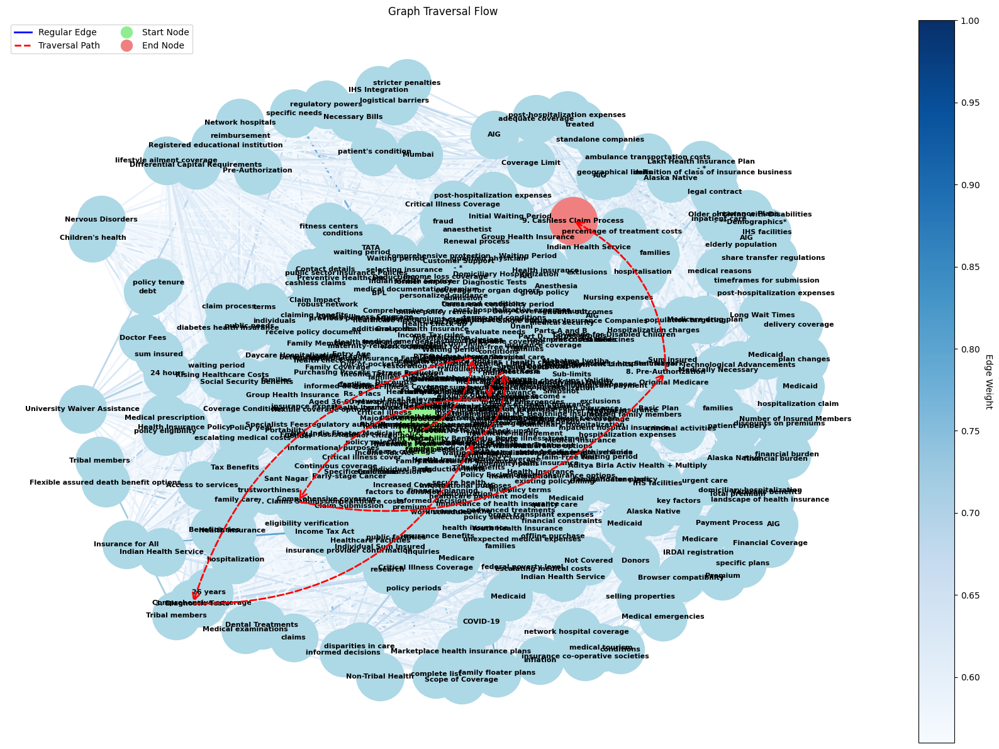


Processing query: What are the eligibility criteria for Ayushman Bharat and other government health insurance programs?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 263:
Content: ### Ayushman Bharat Scheme
In 2018, the Indian government launched the Ayushman Bharat scheme, targe...
Concepts: population targeting, private hospital care, poverty alleviation, government program, Ayushman, healthcare improvement, Ayushman Bharat Scheme, annual coverage, financial coverage, healthcare access
--------------------------------------------------

Step 2 - Node 129 (neighbor of 263):
Content: ## Major Government Health Insurance Programs

1. **Ayushman Bharat - Pradhan Mantri Jan Arogya Yoja...
Concepts: Major Government Health Insurance Programs, government health insurance, free healthcare services, Ayushman, Pradhan Mantri Jan Arogya, PMJAY, secondary hospitalization, tertiary hospitalization, healthcare coverage, large population coverage, financial cove

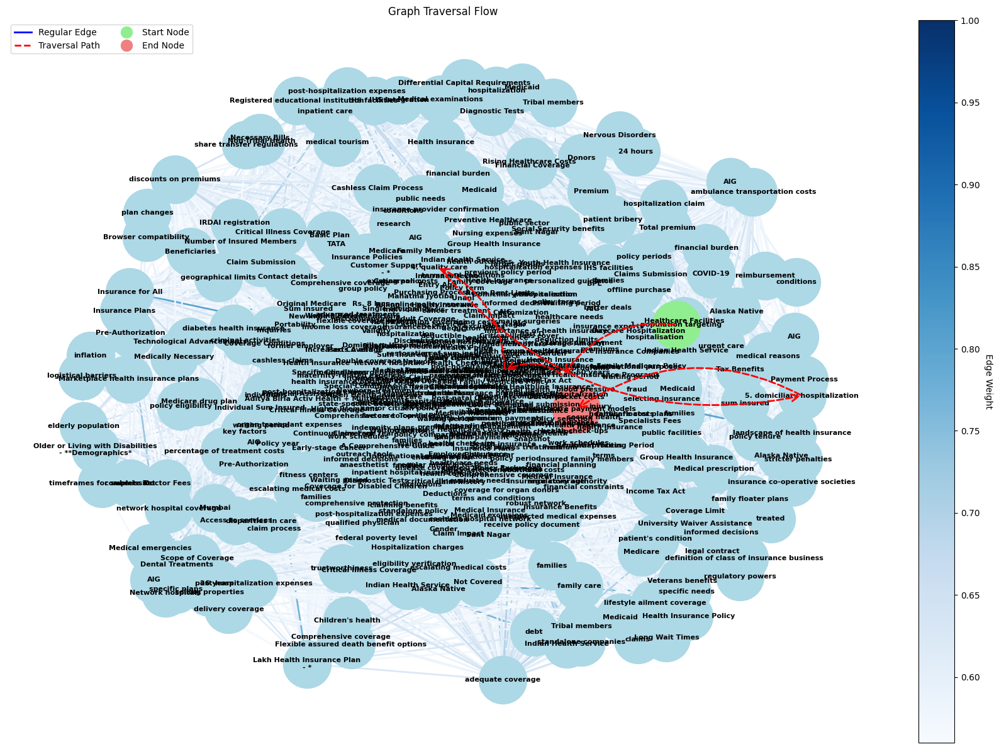


Processing query: How does medical inflation impact health insurance premiums in India?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 196:
Content: ## Effects of Medical Inflation on Health Insurance
- **Rising Premiums**: As medical costs increase...
Concepts: Insurance Companies, Limited Coverage, Medical Inflation, Compensation Payouts, Rising Premiums, Out of Pocket Expenses, Workforce, Health Insurance Benefits, Increased Premiums
--------------------------------------------------

Step 2 - Node 192 (neighbor of 196):
Content: # Impact of Medical Inflation on Health Insurance in India

## Introduction
Inflation in India has s...
Concepts: Hospitalization charges, Medical Inflation on Health Insurance, Policyholders, Medicines, India, Healthcare costs, Doctor fees, Health insurance rates, Medical procedures, Medical inflation
--------------------------------------------------

Step 3 - Node 199 (neighbor of 196):
Content: ## Solutions to Combat 

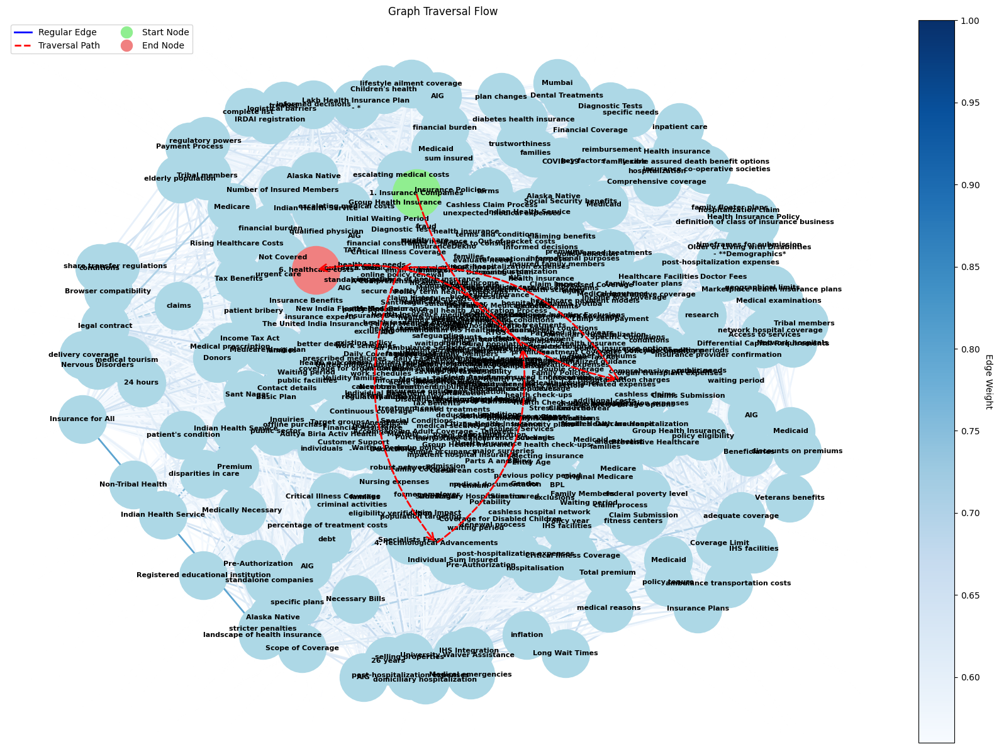


Processing query: What is the waiting period for pre-existing diseases under different health insurance plans?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 52:
Content: ## Waiting Periods
- **Initial Waiting Period**: 30 days for all medical conditions, excluding accid...
Concepts: Initial Waiting Period, Specific Diseases, Pre-existing Diseases, Accidents, Waiting Periods, Waiting Period Duration, Medical Conditions
--------------------------------------------------

Step 2 - Node 294 (neighbor of 52):
Content: ## Exclusions
### General Exclusions
- **Pre-existing Diseases**: Excluded for 48 months from the po...
Concepts: Medically Necessary, Exclusions, General Exclusions, Specified Procedures, Specified Diseases, Pre-existing Diseases, Cosmetic Procedures, 30-Day Waiting Period
--------------------------------------------------

Complete answer found during traversal.

Final Answer: The waiting period for pre-existing diseases under different h

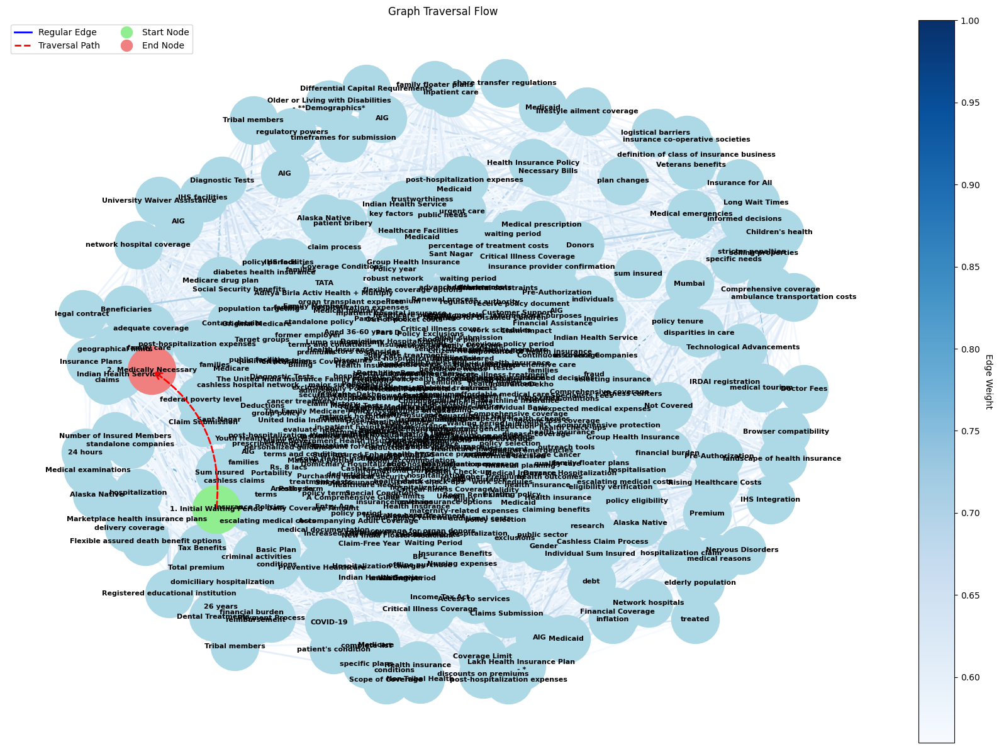


Processing query: What tax benefits can policyholders avail under Section 80D of the Income Tax Act for health insurance?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 449:
Content: ## Tax Benefits
Health insurance premiums are eligible for tax deductions under Section 80D of the I...
Concepts: family floater plans, individual plans, critical illness plans, base policy, additional coverage, health insurance premiums, serious health conditions, sum insured, top-up plans, Income Tax Act, Types of Health Insurance Plans
1, coverage, tax deductions
--------------------------------------------------

Step 2 - Node 385 (neighbor of 449):
Content: ## Tax Benefits

Health insurance premiums qualify for tax deductions under Section 80D:
- Up to INR...
Concepts: comprehensive protection, network hospitals, health insurance premiums, medical costs, financial planning, additional benefits, coverage, tax deductions
-----------------------------------------------

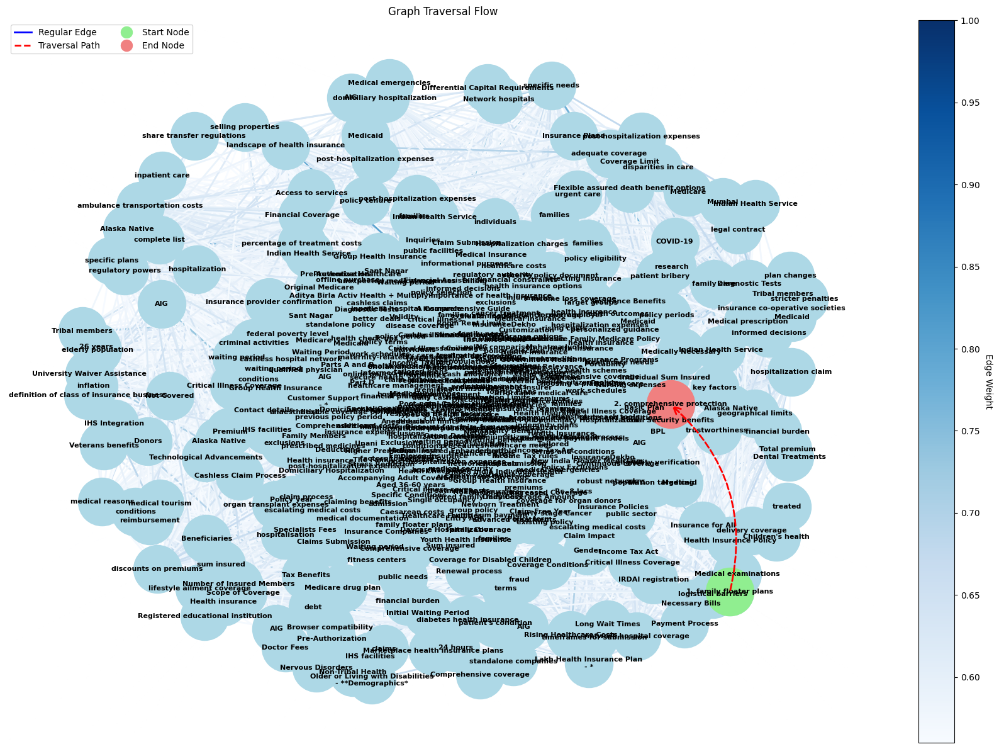


Processing query: What are the advantages of top-up and super top-up health insurance policies in India?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 313:
Content: ### Exclusions
- Injuries sustained while participating in adventure sports.

## Network Hospitals
-...
Concepts: medical security, injuries, New India Health Insurance, network hospitals, exclusions, hospitalization expenses, base health insurance, top-up plan, Types of Health Insurance Plans Offered, health insurance, adventure sports
--------------------------------------------------

Step 2 - Node 450 (neighbor of 313):
Content: ## Coverage Details
Health insurance typically covers:
- Hospitalization expenses
- Treatment costs
...
Concepts: post-hospitalization expenses, cashless claims, waiting period, claim process, insurer, claims, network hospitals, treatment costs, exclusions, pre-hospitalization expenses, cosmetic surgeries, hospitalization expenses, bill settlement, pre-existi

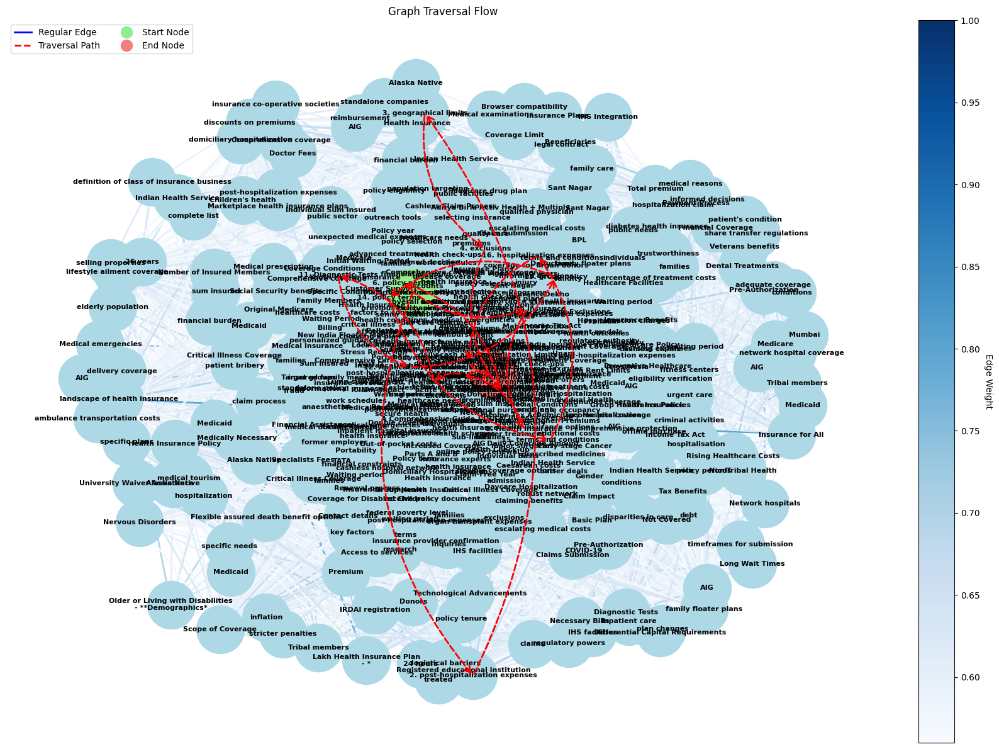


Processing query: How do family floater health insurance policies compare to individual health insurance plans?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 29:
Content: ## Family Floater Health Insurance Products in India
Family floater health insurance policies cover ...
Concepts: health insurance policies, coverage for family members, India, Family floater health insurance, Floater Health Insurance Products, single sum insured
--------------------------------------------------

Step 2 - Node 37 (neighbor of 29):
Content: ## Conclusion
This family floater health insurance policy provides comprehensive coverage for famili...
Concepts: India, financial protection, family floater health insurance, comprehensive coverage, medical expenses, health insurance
--------------------------------------------------

Step 3 - Node 299 (neighbor of 29):
Content: # Health Insurance in India: A Comprehensive Guide

## Introduction
The cost of healthcare in India 

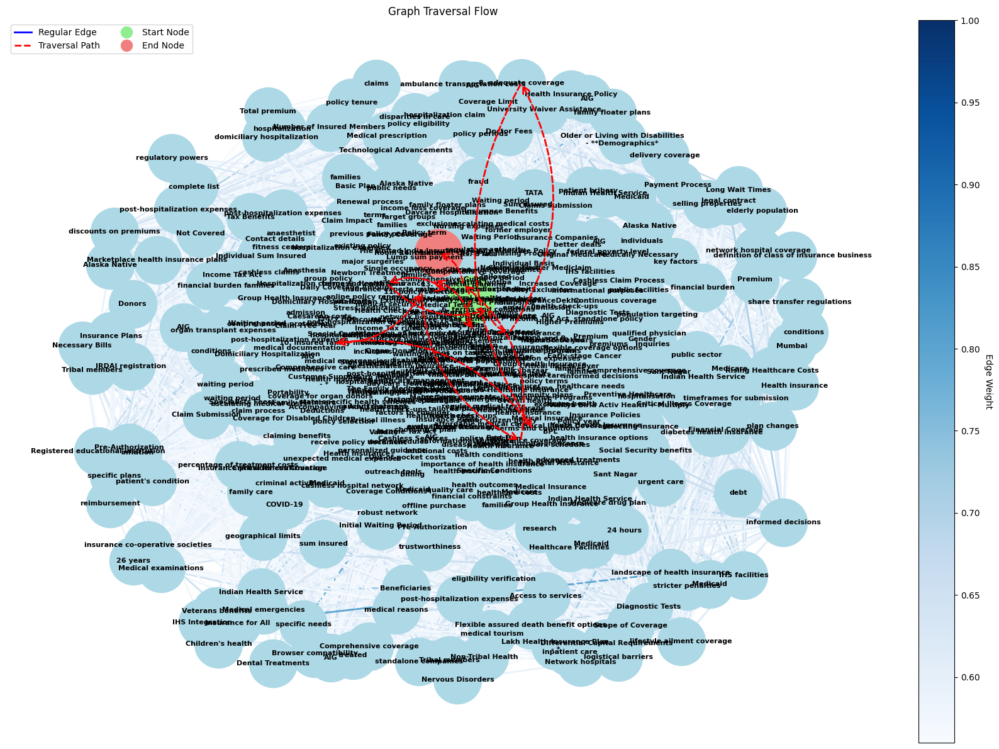


Processing query: What are the common exclusions in health insurance policies that policyholders should be aware of?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 239:
Content: ## Exclusions in Family Health Insurance
Certain treatments and expenses are typically not covered, ...
Concepts: medical documentation, criminal activities, substance abuse, injuries, family health insurance, exclusions, expenses, treatments, cosmetic surgeries, infertility treatments, rehabilitation, medically necessary
--------------------------------------------------

Step 2 - Node 53 (neighbor of 239):
Content: ## Exclusions
### 1. Standard Permanent Exclusions
- Plastic/cosmetic surgery
- Rest cure and rehabi...
Concepts: exclusions, infertility treatments, Standard Permanent Exclusions
- Plastic, birth control, unproven treatments, gender change treatment, permanent exclusions, cosmetic surgery, maternity expenses, insurer terms, plastic surgery, rehabilitation, adven

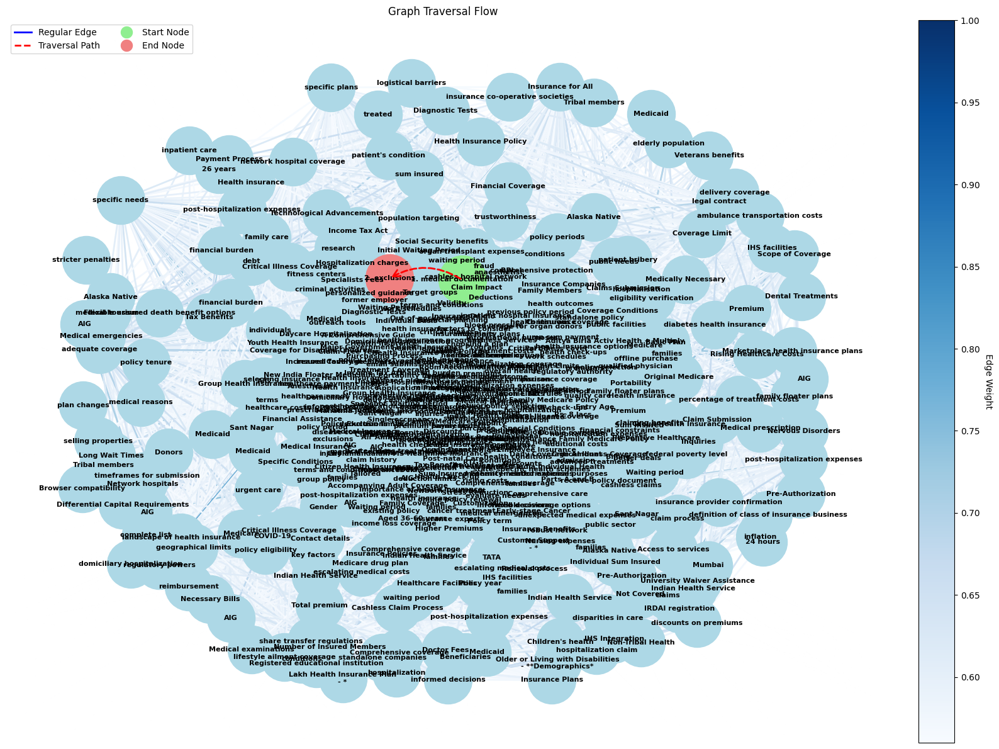


Processing query: What are the benefits and limitations of critical illness health insurance in India?

Retrieving relevant documents...

Traversing the knowledge graph:

Step 1 - Node 281:
Content: ### Critical Illness Insurance
- Provides financial support for specific critical illnesses.
- Cover...
Concepts: disease coverage, group coverage, critical illnesses, employer-provided insurance, additional coverage, manage medical expenses, base health insurance, financial support, Critical Illness Insurance
- Provides
--------------------------------------------------

Step 2 - Node 141 (neighbor of 281):
Content: ### 5. Critical Illness Health Insurance
Covers major lifestyle diseases such as cancer and heart co...
Concepts: lump sum payment, reimbursement, Group Health Insurance, hospitalization, employer-sponsored, additional coverage, Critical Illness Health Insurance, financial protection, Group Health Insurance
Offered, Top-Up Health Insurance, lower premium, limited coverage, med

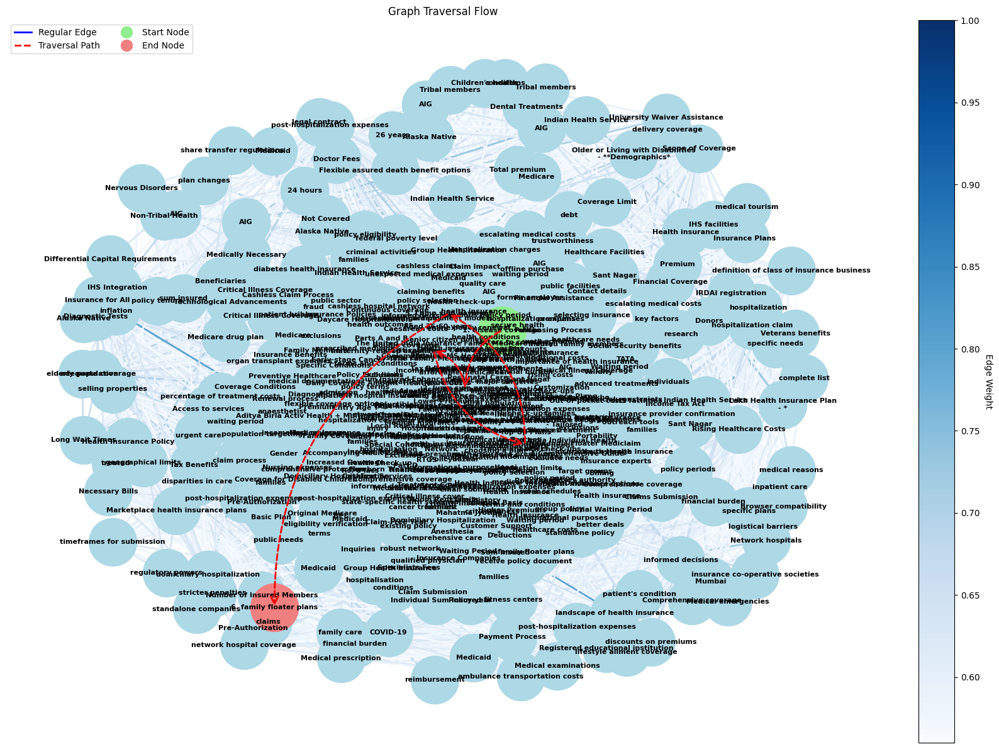

In [14]:
import pandas as pd

# Load the CSV file
file_path = 'graph_rag_final.csv'
df = pd.read_csv(file_path)

# Ensure the first column is treated as queries
query_column = df.columns[0]

# Initialize the columns for responses and context
df['GraphRAG5_context'] = ''
df['GraphRAG5_answer'] = ''

# Process each query and populate the new columns
for idx, query in df[query_column].items():
    response, context = graph_rag.query(query)
    df.at[idx, 'GraphRAG5_context'] = context
    df.at[idx, 'GraphRAG5_answer'] = response

# Save the updated CSV
df.to_csv('updated_graph_rag_final.csv', index=False)